# Permanent magnet assembly B-field simulation

## Stacked disk configuration

Same outer radius R
Separated by R

Maximum B-field along +z direction: 488.047 G
Central B-field along +z axis: 488.047 G
Maximum B-field along +x direction: 488.048 G
Central B-field along +x axis: 488.047 G
Min transverse nonuniformity: 0.0
Max transverse nonuniformity:7.36596569707656e-07
Min axial nonuniformity: 0.0
Max axial nonuniformity:0.005049887803444442


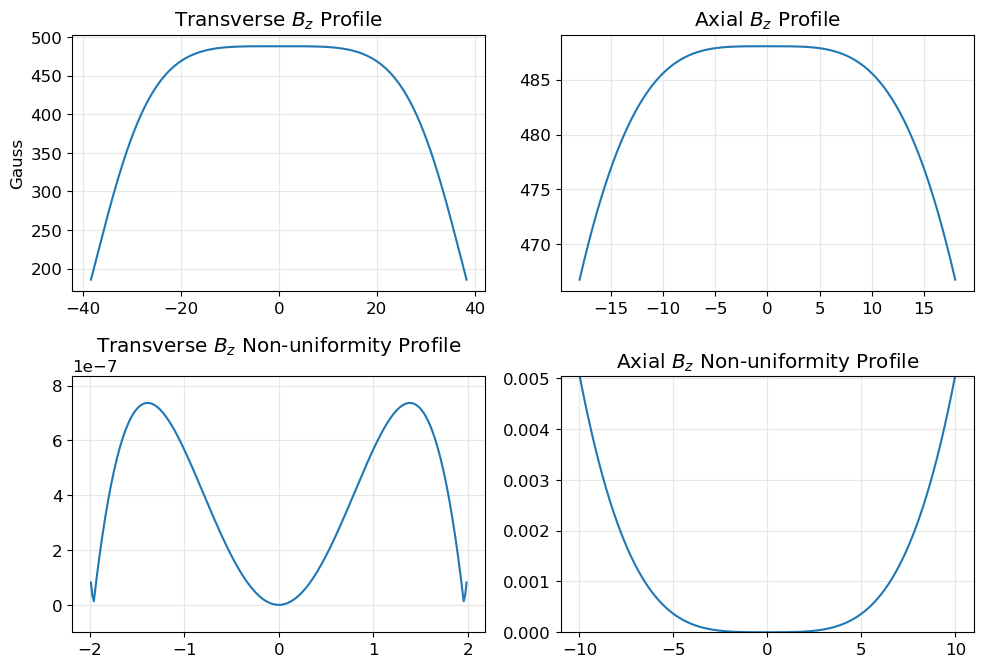

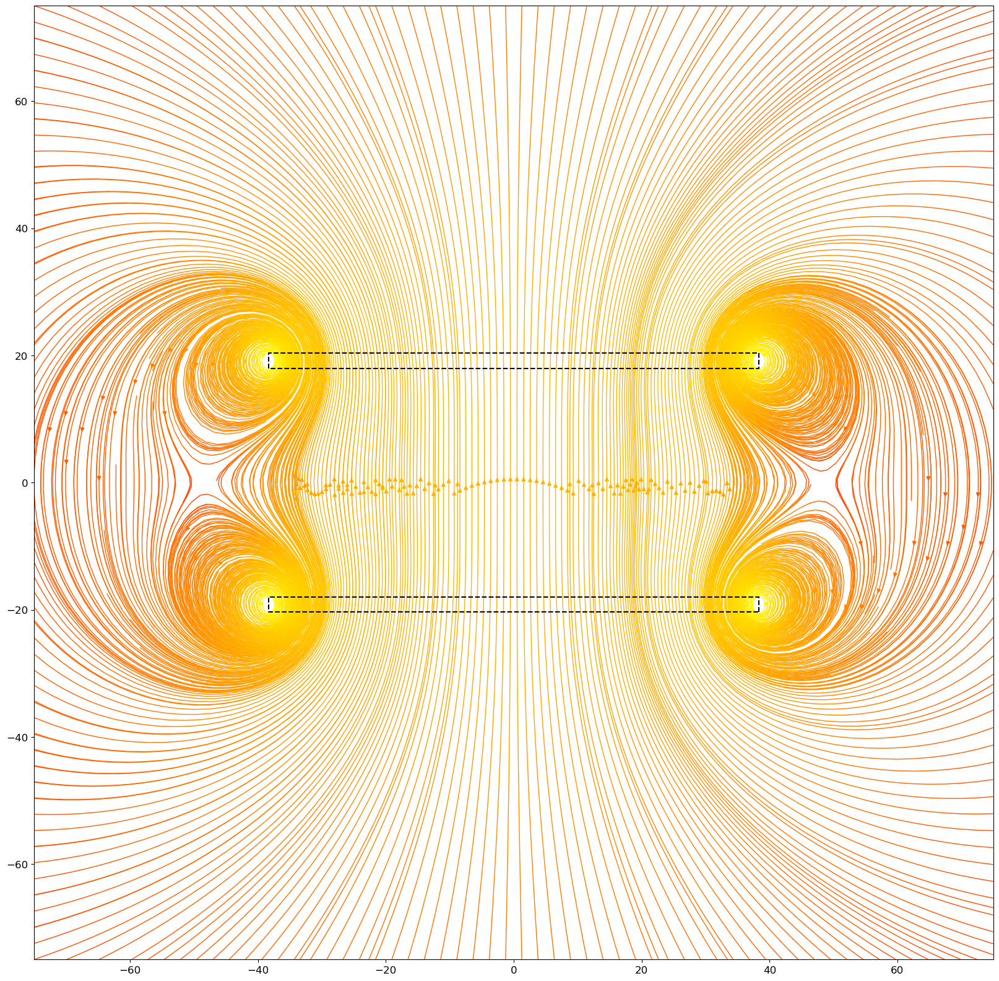

In [1]:
import numpy as np
from maghelper import get_field_on_axes, get_nonuniformity, make_flux_stream
import magpylib as magpy
from magpylib.magnet import CylinderSegment


thickness = 2.4
innerrad = 0
outerrad = 38.354
dist = outerrad / 2
Br = 1.09e3 # in mT
mT_to_T = 1e3
mT_to_G = 10

# define permanent magnet assembly
disk2 = magpy.Collection()
disk_top = CylinderSegment(magnetization=(0, 0, Br),
                           dimension=(innerrad, outerrad, thickness, 0, 360),
                           position = (0, 0, +dist))
disk_bot = CylinderSegment(magnetization=(0, 0, Br),
                           dimension=(innerrad, outerrad, thickness, 0, 360),
                           position = (0, 0, -dist))
disk2.add(disk_top).add(disk_bot)

get_field_on_axes(disk2, 2*(dist-thickness/2), outerrad*2, [-2, 2], [-10, 10])

x_bounds = [-75, 75]
z_bounds = [-75, 75]
nearsurface_z =  dist - thickness/2
farsurface_z = dist + thickness/2

cross_section_disk2 = np.array([
    [[outerrad,outerrad,-outerrad,-outerrad,outerrad], [farsurface_z,nearsurface_z,nearsurface_z,farsurface_z,farsurface_z]],
    [[outerrad,outerrad,-outerrad,-outerrad,outerrad], [-farsurface_z,-nearsurface_z,-nearsurface_z,-farsurface_z,-farsurface_z]],
])
make_flux_stream(disk2, x_bounds, z_bounds, cross_section_disk2)